# Images extractions and rebuild
> a tutorial about how to extract patches from a large image and to rebuild the original image from the extracted patches

- toc: true 
- badges: true
- comments: true
- sticky_rank: 3
- author: Bowen
- categories: [pytorch, fastai2]

![tensor unfold](https://raw.githubusercontent.com/bowenroom/wpFigureBed/master/20200629105522.png)

# pytorch unfold & fold

 Using pytorch unfold and fold to construct the sliding window manually

In [38]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
from skimage import io
import PIL
import os
import mimetypes
import torchvision.transforms as transforms
import glob
from skimage.io import imread
from natsort import natsorted
import re
import numba
from fastai2.vision.all import *
from torchvision.utils import save_image
from torchvision.transforms import ToPILImage

In [39]:
from pdb import set_trace

##  tensor.unfold

In [40]:
x = torch.arange(48).view(3, 4, 4)
x.shape
# x.view(8,8)
x

print('test')
x.unfold(0, 2, 1).shape
x.unfold(0, 2, 1)

print('exp1')
x.unfold(0, 3, 3).shape
x.unfold(0, 3, 3)

print('exp2')
x.unfold(0, 3, 3).unfold(1, 2, 2).shape
x.unfold(0, 3, 3).unfold(1, 2, 2)

print('exp3')
x.unfold(0, 3, 3).unfold(1, 2, 2).unfold(2, 2, 2).shape
x.unfold(0, 3, 3).unfold(1, 2, 2).unfold(2, 2, 2)

torch.Size([3, 4, 4])

tensor([[[ 0,  1,  2,  3],
         [ 4,  5,  6,  7],
         [ 8,  9, 10, 11],
         [12, 13, 14, 15]],

        [[16, 17, 18, 19],
         [20, 21, 22, 23],
         [24, 25, 26, 27],
         [28, 29, 30, 31]],

        [[32, 33, 34, 35],
         [36, 37, 38, 39],
         [40, 41, 42, 43],
         [44, 45, 46, 47]]])

test


torch.Size([2, 4, 4, 2])

tensor([[[[ 0, 16],
          [ 1, 17],
          [ 2, 18],
          [ 3, 19]],

         [[ 4, 20],
          [ 5, 21],
          [ 6, 22],
          [ 7, 23]],

         [[ 8, 24],
          [ 9, 25],
          [10, 26],
          [11, 27]],

         [[12, 28],
          [13, 29],
          [14, 30],
          [15, 31]]],


        [[[16, 32],
          [17, 33],
          [18, 34],
          [19, 35]],

         [[20, 36],
          [21, 37],
          [22, 38],
          [23, 39]],

         [[24, 40],
          [25, 41],
          [26, 42],
          [27, 43]],

         [[28, 44],
          [29, 45],
          [30, 46],
          [31, 47]]]])

exp1


torch.Size([1, 4, 4, 3])

tensor([[[[ 0, 16, 32],
          [ 1, 17, 33],
          [ 2, 18, 34],
          [ 3, 19, 35]],

         [[ 4, 20, 36],
          [ 5, 21, 37],
          [ 6, 22, 38],
          [ 7, 23, 39]],

         [[ 8, 24, 40],
          [ 9, 25, 41],
          [10, 26, 42],
          [11, 27, 43]],

         [[12, 28, 44],
          [13, 29, 45],
          [14, 30, 46],
          [15, 31, 47]]]])

exp2


torch.Size([1, 2, 4, 3, 2])

tensor([[[[[ 0,  4],
           [16, 20],
           [32, 36]],

          [[ 1,  5],
           [17, 21],
           [33, 37]],

          [[ 2,  6],
           [18, 22],
           [34, 38]],

          [[ 3,  7],
           [19, 23],
           [35, 39]]],


         [[[ 8, 12],
           [24, 28],
           [40, 44]],

          [[ 9, 13],
           [25, 29],
           [41, 45]],

          [[10, 14],
           [26, 30],
           [42, 46]],

          [[11, 15],
           [27, 31],
           [43, 47]]]]])

exp3


torch.Size([1, 2, 2, 3, 2, 2])

tensor([[[[[[ 0,  1],
            [ 4,  5]],

           [[16, 17],
            [20, 21]],

           [[32, 33],
            [36, 37]]],


          [[[ 2,  3],
            [ 6,  7]],

           [[18, 19],
            [22, 23]],

           [[34, 35],
            [38, 39]]]],



         [[[[ 8,  9],
            [12, 13]],

           [[24, 25],
            [28, 29]],

           [[40, 41],
            [44, 45]]],


          [[[10, 11],
            [14, 15]],

           [[26, 27],
            [30, 31]],

           [[42, 43],
            [46, 47]]]]]])

![](https://raw.githubusercontent.com/bowenroom/wpFigureBed/master/tensor_unfold.gif)

In [41]:
temp = torch.randint(0, 10, (3, 5176, 3793))
temp.shape
patches = temp.unfold(0, 3, 3)
patches.shape
test_eq(temp.unfold(0, 3, 3), temp.unfold(0, 3, 4))

patches = patches.unfold(1, 128, 128)
patches.shape

patches = patches.unfold(2, 128, 128)
# test_eq(temp.unfold(0,3,3),temp.unfold(0,3,66))
patches.shape

torch.Size([3, 5176, 3793])

torch.Size([1, 5176, 3793, 3])

torch.Size([1, 40, 3793, 3, 128])

torch.Size([1, 40, 29, 3, 128, 128])

In [42]:
math.floor((5176-128)/128)+1

40

In [43]:
math.floor((3793-128)/128)+1

29

## tensor.unfold.rules

> important  
eg.  
<font color=red>(a,b) = x.shape   x.unfold(c,d,e)  </font> <font color=blue>where d is the size and e is the step</font>   
from here we can see it: the shape value at dimension *c* after unfold method is that:   
eg. at *a* 's dimension:  
<font color=red>**(math.floor(a-d)/e +1,b,d)**  </font>  
BTW: the last one is to append the **size** value in the unfold method



## torch.nn.unfold and fold

 unfold https://pytorch.org/docs/master/generated/torch.nn.Unfold.html#torch.nn.Unfold

In [44]:
inp = torch.randn(1,3,10,12)
w = torch.randn(2,3,4,5)
inp_unf = torch.nn.functional.unfold(inp,(4,5))
inp_unf.shape

torch.Size([1, 60, 56])

fold https://pytorch.org/docs/master/generated/torch.nn.Fold.html?highlight=fold#torch.nn.Fold

# experiment on an Image

(1536, 2048)


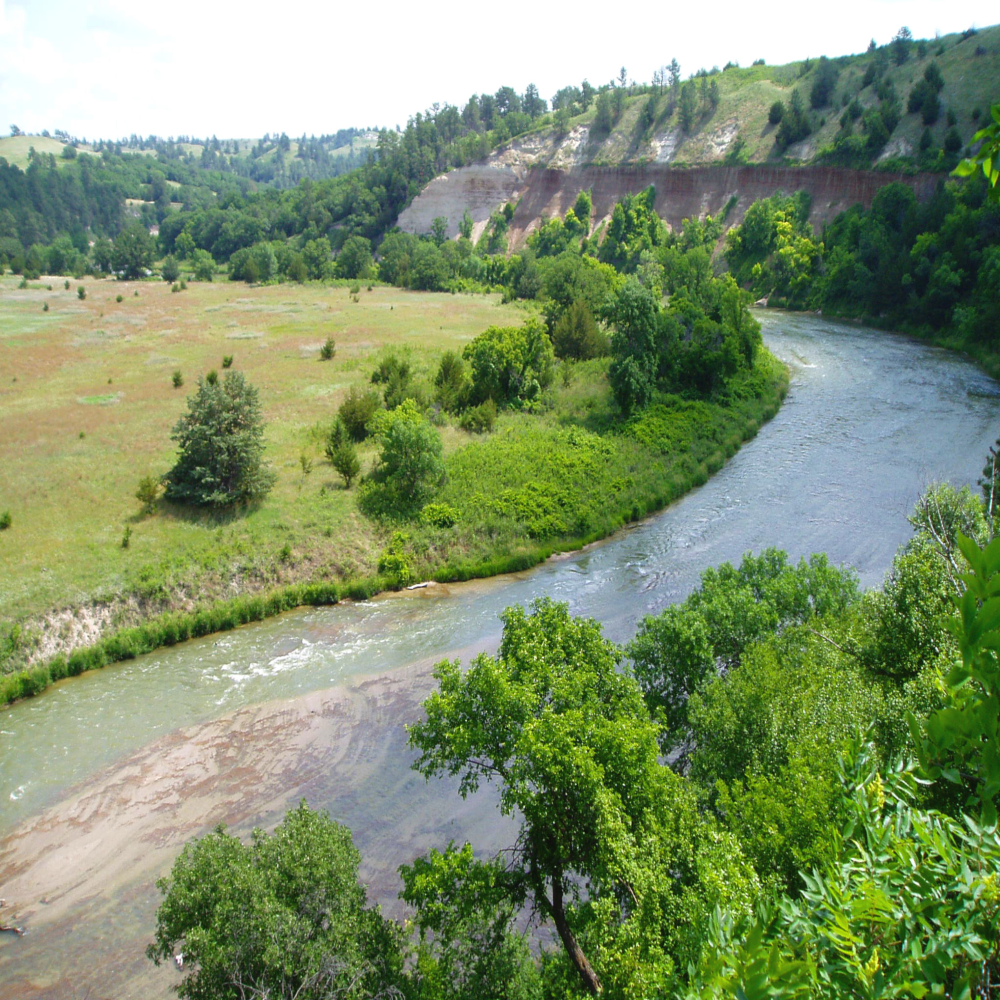

torch.Size([3, 1500, 1500])

In [45]:
# !wget https://eoimages.gsfc.nasa.gov/images/imagerecords/88000/88094/niobrara_photo_lrg.jpg
patch_size=512
stride=patch_size
pil2tensor = transforms.ToTensor()


file=Path('niobrara_photo_lrg.jpg')
filename=file.stem
im1 = Image.open(file)
print(im1.shape)
# im1.resize(5120,5120)

im1 = im1.resize((1500,1500),Image.BILINEAR)
im1

rgb_image = pil2tensor(im1)
rgb_image.shape


In [46]:
rgb_image.data.type()

'torch.FloatTensor'

## tensor.unfold

In [47]:
patches = rgb_image.data.unfold(0, 3, 3).unfold(1, patch_size, stride).unfold(2, patch_size, stride)
print(patches.shape)

torch.Size([1, 2, 2, 3, 512, 512])


https://pytorch.org/docs/master/generated/torch.split.html

In [48]:
a = list(patches.shape)


In [49]:
a
torch.from_numpy(np.arange(0,a[1]))
patches[:,torch.from_numpy(np.arange(0,a[1])),:,:,:,:].shape
x = patches[:,torch.from_numpy(np.arange(0,a[1])),:,:,:,:].split(1, dim=1)
x = patches.split(1, dim=1)
# x = patches.split(1, dim=2)

len(x)
x[0].shape
x[1].shape

[1, 2, 2, 3, 512, 512]

tensor([0, 1])

torch.Size([1, 2, 2, 3, 512, 512])

2

torch.Size([1, 1, 2, 3, 512, 512])

torch.Size([1, 1, 2, 3, 512, 512])

In [50]:
to_pil = ToPILImage()
math.floor(1500/512)

2

In [51]:
6000/512

11.71875

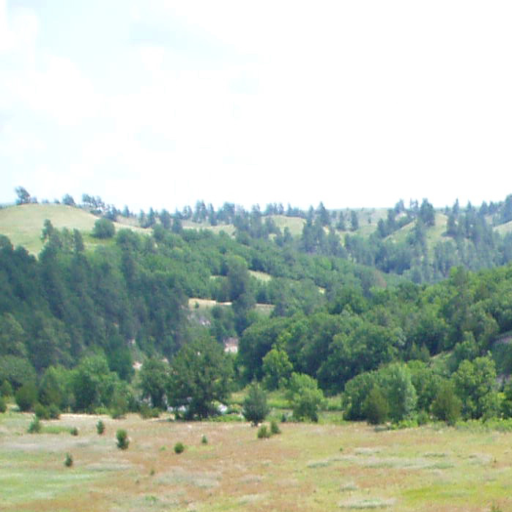

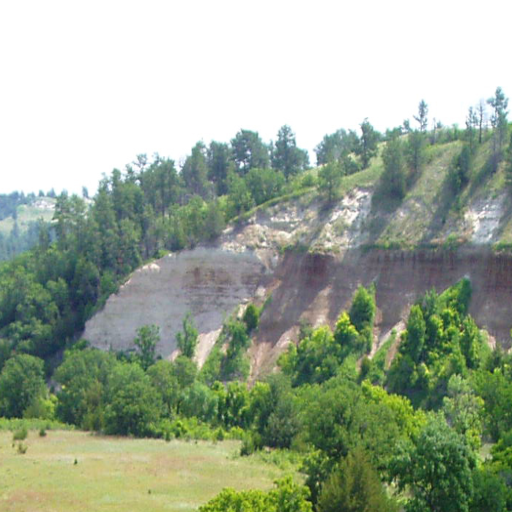

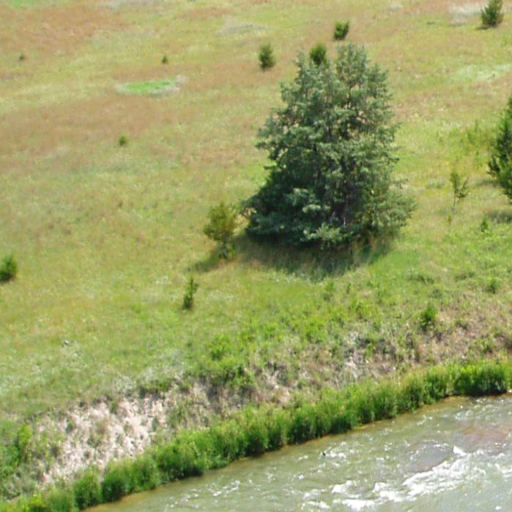

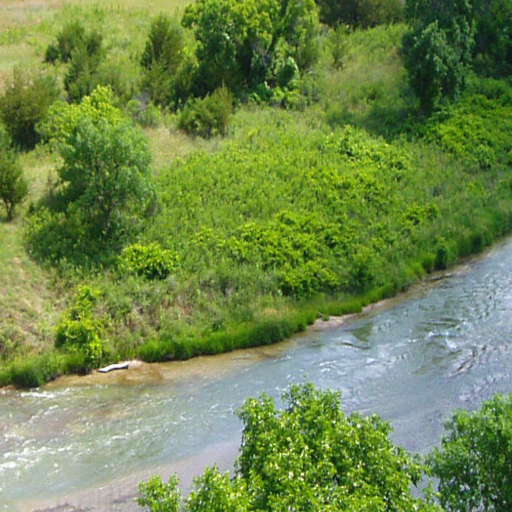

In [52]:
x = patches[:,torch.from_numpy(np.arange(0,a[1])),:,:,:,:].split(1, dim=1)
for i in list(np.arange(a[1])):
    
    y =  x[i][:,:,torch.from_numpy(np.arange(0,a[2])),:,:,:].split(1, dim=2)
    for j in list(np.arange(a[2])):
        img = to_pil(y[j].squeeze(0).squeeze(0).squeeze(0))
        img
#         set_trace()
#         save_image(y[j], filename+'-'+str(i)+'-'+str(j)+'.png')

## nn.functional.unfold and fold to extract and reconstruct

https://discuss.pytorch.org/t/seemlessly-blending-tensors-together/65235/9

In [53]:
def split_tensor(tensor, tile_size=256):
    mask = torch.ones_like(tensor)
    # use torch.nn.Unfold
    stride  = tile_size//2
    unfold  = nn.Unfold(kernel_size=(tile_size, tile_size), stride=stride)
    # Apply to mask and original image
    mask_p  = unfold(mask)
    patches = unfold(tensor)
	
    patches = patches.reshape(3, tile_size, tile_size, -1).permute(3, 0, 1, 2)
    if tensor.is_cuda:
        patches_base = torch.zeros(patches.size(), device=tensor.get_device())
    else: 
        patches_base = torch.zeros(patches.size())
	
    tiles = []
    for t in range(patches.size(0)):
         tiles.append(patches[[t], :, :, :])
    return tiles, mask_p, patches_base, (tensor.size(2), tensor.size(3))

def rebuild_tensor(tensor_list, mask_t, base_tensor, t_size, tile_size=256):
    stride  = tile_size//2  
    # base_tensor here is used as a container

    for t, tile in enumerate(tensor_list):
         print(tile.size())
         base_tensor[[t], :, :] = tile  
	 
    base_tensor = base_tensor.permute(1, 2, 3, 0).reshape(3*tile_size*tile_size, base_tensor.size(0)).unsqueeze(0)
    fold = nn.Fold(output_size=(t_size[0], t_size[1]), kernel_size=(tile_size, tile_size), stride=stride)
    # https://discuss.pytorch.org/t/seemlessly-blending-tensors-together/65235/2?u=bowenroom
    output_tensor = fold(base_tensor)/fold(mask_t)
    # output_tensor = fold(base_tensor)
    return output_tensor

torch.Size([1, 3, 660, 660])
torch.Size([1, 3, 660, 660])
torch.Size([1, 3, 660, 660])
torch.Size([1, 3, 660, 660])
torch.Size([1, 3, 660, 660])
torch.Size([1, 3, 660, 660])
the whole length of the patches is 6
the current is 0


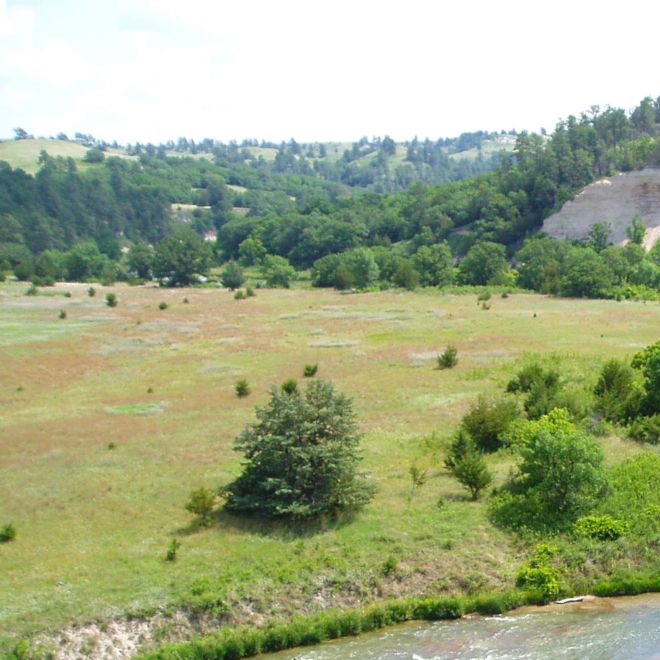

the current is 1


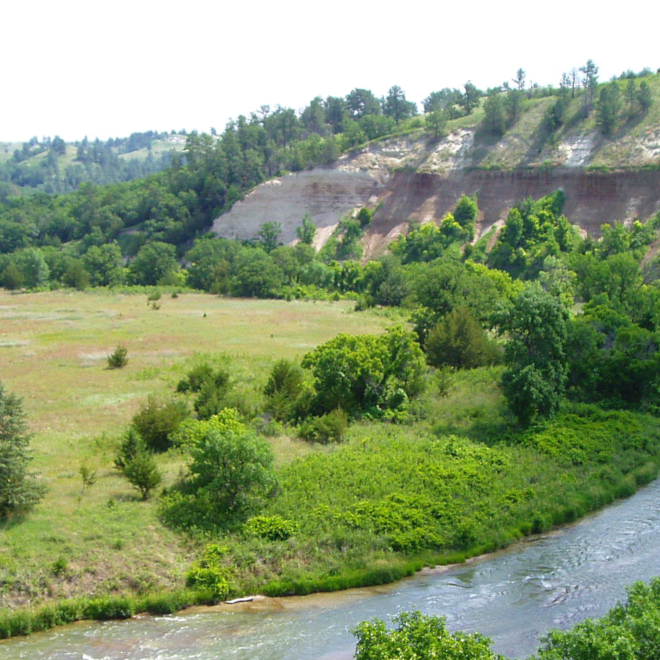

the current is 2


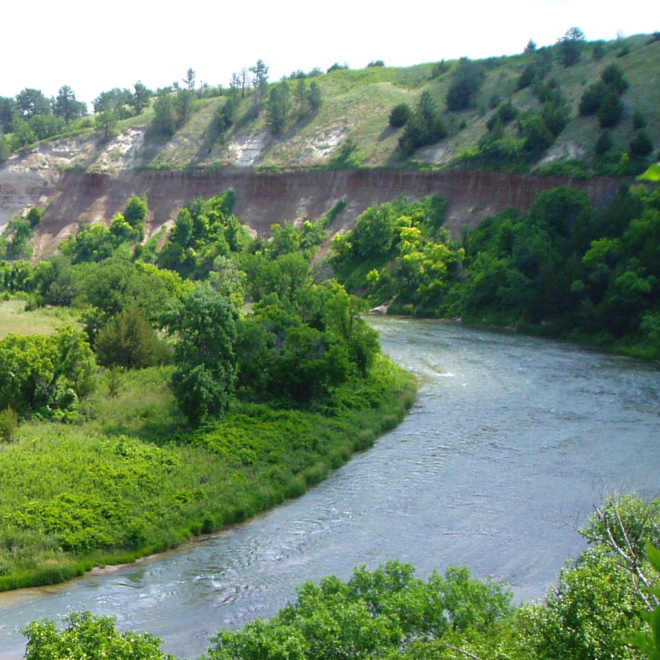

the current is 3


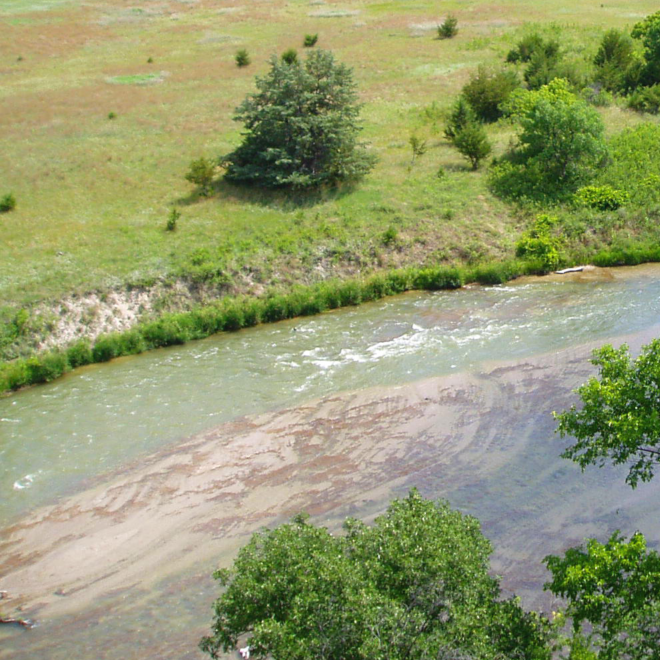

the current is 4


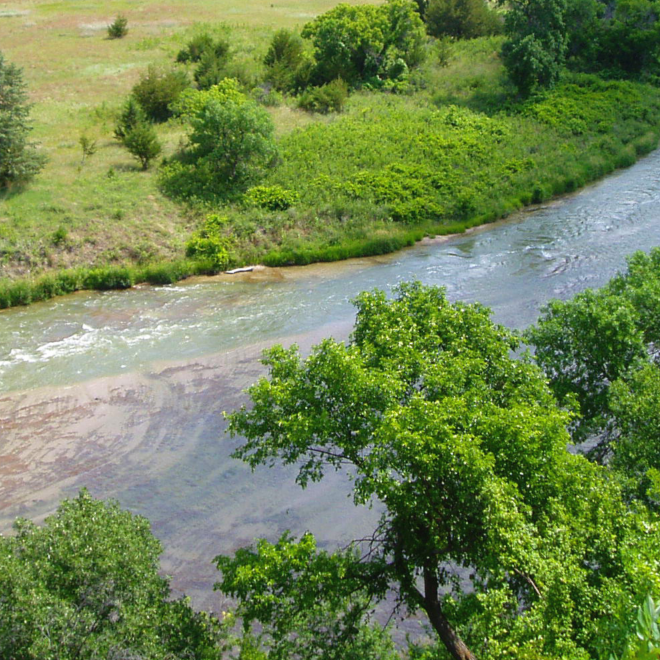

the current is 5


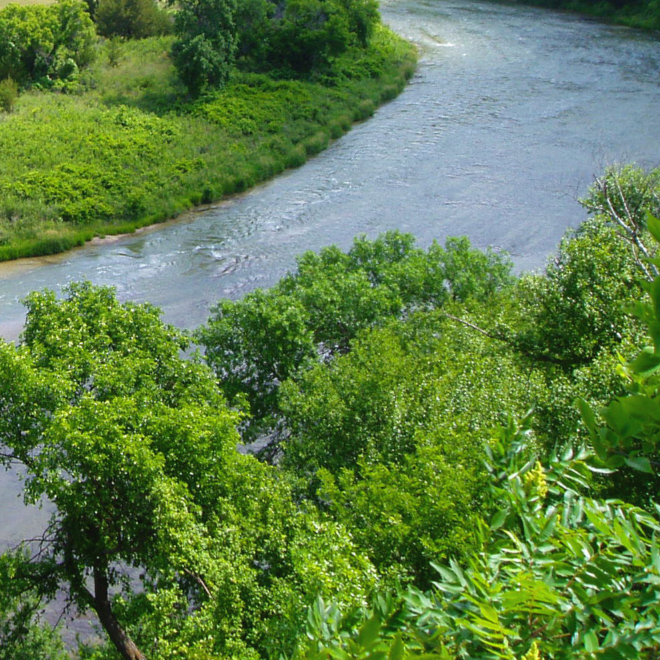

the reconstruct image


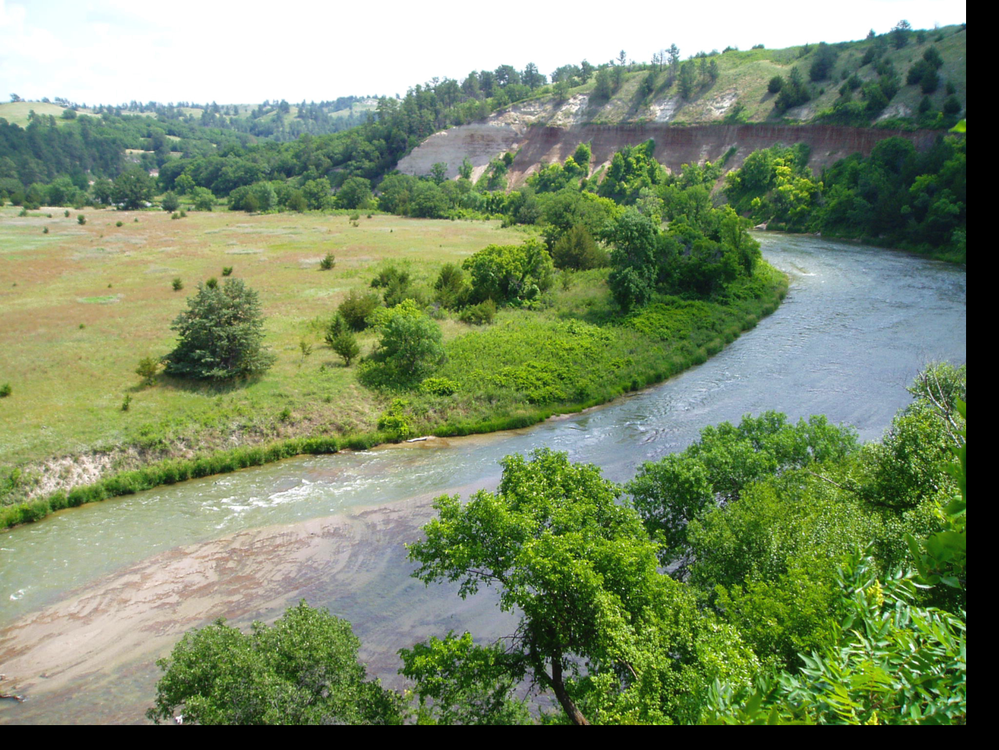

In [54]:
# %%time
test_image = 'test_image.jpg'
image_size=1024
Loader = transforms.Compose([transforms.Resize(image_size), transforms.ToTensor()])
input_tensor = Loader(Image.open(file).convert('RGB')).unsqueeze(0).cuda()


# Split image into overlapping tiles
tile_tensors, mask_t, base_tensor, t_size = split_tensor(input_tensor, 660)


# Put tiles back together
output_tensor = rebuild_tensor(tile_tensors, mask_t, base_tensor, t_size, 660)

# Save Output
Image2PIL = transforms.ToPILImage()
print(f'the whole length of the patches is {len(tile_tensors)}')
# show small patches
for i in range(len(tile_tensors)):
    print(f'the current is {i}')
    Image2PIL(tile_tensors[i].cpu().squeeze(0))
print('the reconstruct image')
Image2PIL(output_tensor.cpu().squeeze(0))
# Image2PIL(output_tensor.cpu().squeeze(0)).save('output_image.png')

In [55]:
6000/512

11.71875

# fastai2.PILImage and PIL.image

In [60]:
len(tile_tensors)
tile_tensors[0].size()

6

torch.Size([1, 3, 660, 660])

In [63]:
tile_tensors[0].squeeze(0)

tensor([[[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [0.5647, 0.5451, 0.4902,  ..., 0.7490, 0.7569, 0.7412],
         [0.5490, 0.5529, 0.4863,  ..., 0.7412, 0.7490, 0.7412],
         [0.5608, 0.5686, 0.5059,  ..., 0.7412, 0.7569, 0.7529]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [0.6667, 0.6549, 0.6196,  ..., 0.7647, 0.7686, 0.7490],
         [0.6431, 0.6510, 0.6039,  ..., 0.7451, 0.7529, 0.7412],
         [0.6471, 0.6549, 0.6078,  ..., 0.7333, 0.7451, 0.7412]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.

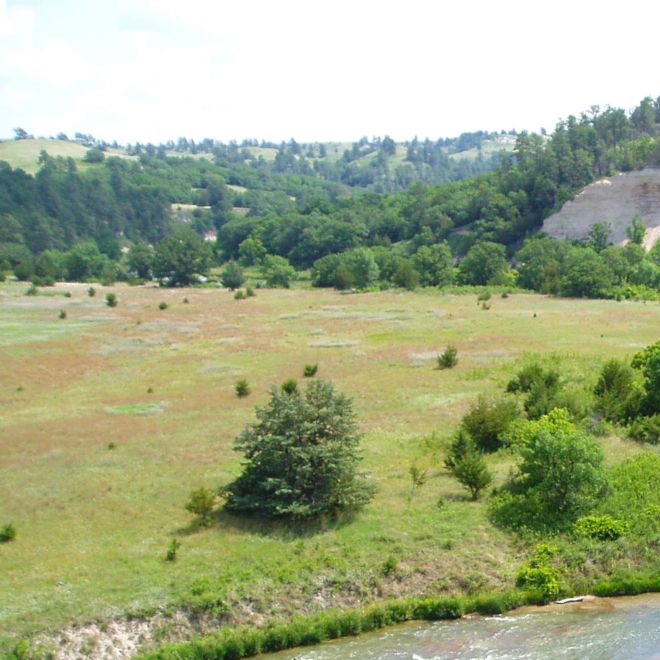

(660, 660)

In [66]:
temp = PILImage(Image2PIL(tile_tensors[0].cpu().squeeze(0)))
temp
temp.shape